# processing data

In [1]:
from pandas import read_csv
from json import load, dump

df = read_csv('GAME Sequencing/taxonomy.tsv', sep='\t').set_index('Feature ID')
df 

,Taxon,Confidence
Feature ID,,
a5ad9574a1f8aea06b6dfaff6eddfff7,k__Bacteria; p__Proteobacteria; c__Gammaproteo...,0.876989
a27f37aae2a34101f8a61c6f0b1cd246,k__Bacteria; p__Firmicutes; c__Clostridia; o__...,0.812380
6589433bc08b7cdc5ea1e4928683ed00,k__Bacteria; p__Actinobacteriota; c__Actinobac...,0.978255
38b371de3be6ddef03bea94294e9830d,k__Archaea; p__Euryarchaeota; c__Methanobacter...,0.872175
1b976cc787b3465ddcc891c15c968a9b,k__Bacteria; p__Proteobacteria; c__Gammaproteo...,0.999524
...,...,...
31c50a4d3207815f673d3edebf772af3,k__Bacteria; p__Planctomycetota; c__Planctomyc...,0.986020
36090a0d50aa4bbbffdd4b9953b0c500,k__Bacteria; p__Firmicutes; c__Clostridia; o__...,0.767113
a35cb9ab8e98072e9a43f7285279bcde,k__Bacteria; p__Firmicutes; c__Dethiobacteria;...,0.999985


In [4]:
df.to_json('taxonomy.json')

js=load(open('taxonomy.json','r'))
js.keys()

dict_keys(['Taxon', 'Confidence'])

In [5]:
definitions = {'k': 'Kingdom', 'p': 'Phylum', 'c': 'Class', 'o': 'Order', 'f': 'Family', 'g': 'Genus', 's': 'Species'}


print(js['Taxon']['a5ad9574a1f8aea06b6dfaff6eddfff7'])
for asv in js['Taxon']:
    dic = {}
    print(asv)
    for p in js['Taxon'][asv].split('; '): 
        content = p.split('__')
        # print(content)
        content[0] = definitions[content[0]] 
        # print('\n')
        # print(dict(content))
        dic[content[0]] = content[1]
    js['Taxon'][asv] = dic

print(js['Taxon']['a5ad9574a1f8aea06b6dfaff6eddfff7'])

k__Bacteria; p__Proteobacteria; c__Gammaproteobacteria; o__Pseudomonadales; f__Halomonadaceae; g__Halomonas; s__midas_s_110869
a5ad9574a1f8aea06b6dfaff6eddfff7
a27f37aae2a34101f8a61c6f0b1cd246
6589433bc08b7cdc5ea1e4928683ed00
38b371de3be6ddef03bea94294e9830d
1b976cc787b3465ddcc891c15c968a9b
3dd54183eecfa8bb215520814056e4b0
1240eb67c8c5004296a23b80d1a10296
016c815a4508d59f5cd00df84f95fa5d
a353b92733af5260a57dd1a0ba3001e1
9ab23c4d99ca81eaa9c30826e3201dd4
e95282c3197d4315d84f31d177642c58
076b820e5b709e62b933f76ab6c45254
3ade0fa13e56aac194bb3373200d6def
b96715d4c2e39e415550cf66da8a67f5
3487ee381e9bba57861b67ac3936d665
08ea1c9b9d368cd6d9bfeb8857e90315
fd95b1c4fe440dbd2ad6a10e70f8ae45
308aa3982d3c398eaae8efce7b0803f2
cd05a4b1cda569ae366c6980823f4c72
07246a1fc2c2fed9e54374f5ee46c333
8c86a02bd0f2c7a90bb40b735577a623
e561c5c5f92aa66e6b1befb81385d1fc
ae72db992b92b97750fc6662153b5369
64fc10f0a6641c24f1fc81c23d55d3b7
cd1f95189b8375347f827f4a8b08dcf7
b65ddb808f41ed58f0a87829f790124c
07e00e1bcc9d9a3

In [6]:
dump(js, open('new_taxonomy.json', 'w'), indent=3)
js

{'Taxon': {'a5ad9574a1f8aea06b6dfaff6eddfff7': {'Kingdom': 'Bacteria',
   'Phylum': 'Proteobacteria',
   'Class': 'Gammaproteobacteria',
   'Order': 'Pseudomonadales',
   'Family': 'Halomonadaceae',
   'Genus': 'Halomonas',
   'Species': 'midas_s_110869'},
  'a27f37aae2a34101f8a61c6f0b1cd246': {'Kingdom': 'Bacteria',
   'Phylum': 'Firmicutes',
   'Class': 'Clostridia',
   'Order': 'Peptostreptococcales-Tissierellales',
   'Family': 'Serpentinicella',
   'Genus': 'midas_g_75908'},
  '6589433bc08b7cdc5ea1e4928683ed00': {'Kingdom': 'Bacteria',
   'Phylum': 'Actinobacteriota',
   'Class': 'Actinobacteria',
   'Order': 'Corynebacteriales',
   'Family': 'Corynebacteriaceae',
   'Genus': 'Corynebacterium',
   'Species': 'midas_s_5929'},
  '38b371de3be6ddef03bea94294e9830d': {'Kingdom': 'Archaea',
   'Phylum': 'Euryarchaeota',
   'Class': 'Methanobacteria',
   'Order': 'Methanobacteriales',
   'Family': 'Methanobacteriaceae',
   'Genus': 'Methanobacterium',
   'Species': 'Methanobacterium_beij

In [21]:
from pandas import read_excel
from json import dump
# ab = read_csv("GAME Sequencing/ASV_abundance_wideform.csv").set_index("seq")
ab = read_excel("Abundance Sep 17 2025.xlsx").set_index("seq")
# display(ab)

ab_js = {}
taxonomy_js = {}
for i, row in ab.iterrows():
    ab_js.setdefault(row["sample"], {})
    ab_js[row["sample"]][i] = row["rel_ab"]
    
    taxonomy_js.setdefault(i, {})
    taxonomy_js[i]["Kingdom"] = row["Kingdom"]
    taxonomy_js[i]["Phylum"] = row["Phylum"]
    taxonomy_js[i]["Class"] = row["Class"]
    taxonomy_js[i]["Order"] = row["Order"]
    taxonomy_js[i]["Family"] = row["Family"]
    taxonomy_js[i]["Genus"] = row["Genus"]
    taxonomy_js[i]["Species"] = row["Species"]
    

dump(ab_js, open("new_abundances.json", "w"))
dump(taxonomy_js, open("new_taxonomy.json", "w"))

In [22]:
ab

,sample,rel_ab,Kingdom,Phylum,Class,Order,Family,Genus,Species
seq,,,,,,,,,
f0f5fe3a3ccc66ce7e67e82294654107,10AB,0.306958,Bacteria,Bacteroidota,Bacteroidia,Cytophagales,Cyclobacteriaceae,midas_g_83754,NaN
f0f5fe3a3ccc66ce7e67e82294654107,A34,0.000000,Bacteria,Bacteroidota,Bacteroidia,Cytophagales,Cyclobacteriaceae,midas_g_83754,NaN
f0f5fe3a3ccc66ce7e67e82294654107,B34,0.000000,Bacteria,Bacteroidota,Bacteroidia,Cytophagales,Cyclobacteriaceae,midas_g_83754,NaN
f0f5fe3a3ccc66ce7e67e82294654107,C3,0.000000,Bacteria,Bacteroidota,Bacteroidia,Cytophagales,Cyclobacteriaceae,midas_g_83754,NaN
f0f5fe3a3ccc66ce7e67e82294654107,D34,0.000000,Bacteria,Bacteroidota,Bacteroidia,Cytophagales,Cyclobacteriaceae,midas_g_83754,NaN
...,...,...,...,...,...,...,...,...,...
40da09c73f84b20e7a882a02f485f1f3,K12,0.000000,Bacteria,Firmicutes,midas_c_145,Gelria,NaN,NaN,NaN
40da09c73f84b20e7a882a02f485f1f3,L12,0.000000,Bacteria,Firmicutes,midas_c_145,Gelria,NaN,NaN,NaN
40da09c73f84b20e7a882a02f485f1f3,M12,0.000000,Bacteria,Firmicutes,midas_c_145,Gelria,NaN,NaN,NaN


In [9]:
md = read_csv("C:/Users/danie/OneDrive/Desktop/GAME Sequencing/GAME_Metadata.csv").set_index("sample")
md

,date,days
sample,,
1AB,9.11.23,45.0
2AB,7.73.23,1.0
3AB,10.2.22,66.0
4AB,8.24.23,25.0
5AB,10.15.23,79.0
6AB,10.15.23,81.0
7AB,5.10.24,NaN


In [10]:
md.T.to_json('metadata.json')

md_js=load(open('metadata.json','r'))

md_js.keys()

md_js

{'1AB': {'date': '9.11.23', 'days': 45.0},
 '2AB': {'date': '7.73.23', 'days': 1.0},
 '3AB': {'date': '10.2.22', 'days': 66.0},
 '4AB': {'date': '8.24.23', 'days': 25.0},
 '5AB': {'date': '10.15.23', 'days': 79.0},
 '6AB': {'date': '10.15.23', 'days': 81.0},
 '7AB': {'date': '5.10.24', 'days': None}}

# visualizing data

In [27]:
no_features = ['03a6a6d84a7be4b11b6467c91ca79d57', '76ef356d895e6434580f18ab74a63e6c', 'eca00dcc9a01255b6cb66fbd5b3bd285']
for ID in no_features:
    print(ab_js["M12"][ID])
    # print(md_js["M12"][ID])
    print(taxonomy_js[ID])

0.0
{'Kingdom': 'Bacteria', 'Phylum': nan, 'Class': nan, 'Order': nan, 'Family': nan, 'Genus': nan, 'Species': nan}
0.0
{'Kingdom': 'Bacteria', 'Phylum': nan, 'Class': nan, 'Order': nan, 'Family': nan, 'Genus': nan, 'Species': nan}
0.0
{'Kingdom': 'Bacteria', 'Phylum': nan, 'Class': nan, 'Order': nan, 'Family': nan, 'Genus': nan, 'Species': nan}


In [18]:
ab_js = {k: {k2:v2 for k2,v2 in v.items() if v2 > 0.001} for k,v in ab_js.items()}
ab_js = {k: dict(sorted(abundances.items(), key=lambda item: item[1], reverse=True))
          for k, abundances in ab_js.items()}
top3s = []
for sample, abundances in ab_js.items():
    # print(sample)
    top3s.extend(list(abundances.keys())[:3])
    # display(list(abundances.items())[:3])

    # total = sum(abundances.values())
    # ab_js[sample] = {k: v/total for k, v in abundances.items()}
# ab_js
print(set(top3s))

samples = list(ab_js.keys())
for i, top in enumerate(top3s):
    if i%3 == 0: print(f"\nSample: {samples[i//3]}")
    print(taxonomy_js[top]["Family"])

{'63f37ee4b481fccdffca10160ed5b944', '07e00e1bcc9d9a3c50591f721785e591', 'c55a8101fb6c187736f0af61f720cb92', '7f78afb7e1d45cd528fe9cd909c93fb5', '35dbde30af820a2c3bcd85216229ad6a', '4c31c3e198534eab45b6d92b61f75b10', 'a039c1ac15b3f4bc5cf1db8a5f1cc0fd', '8466f2635d9fbf9c51a04877474f3d09', '25c54c57b4a4283237b33fdae82003c0', 'b64cf0e9dea8cef6b9500b364c179b98', '04869be25e3dc4d526ce3824d407aedf', '38b371de3be6ddef03bea94294e9830d', '0fec351445f84bd482075ceda6123f46', 'cd05a4b1cda569ae366c6980823f4c72'}

Sample: 10AB
Methanobacteriaceae
Dethiobacteraceae
Rhodocyclaceae

Sample: A34
Alcaligenaceae
Peptostreptococcaceae
Methanobacteriaceae

Sample: B34
Alcaligenaceae
Methanobacteriaceae
Methanobacteriaceae

Sample: C3
Methanobacteriaceae
Lentimicrobiaceae
Peptostreptococcaceae

Sample: D34
Methanosarcinaceae
Lentimicrobiaceae
Methanobacteriaceae

Sample: E34
Methanobacteriaceae
Lentimicrobiaceae
Methanosarcinaceae

Sample: F34
Methanobacteriaceae
Lentimicrobiaceae
Methanobacteriaceae

Sample

# abundance figures

10AB


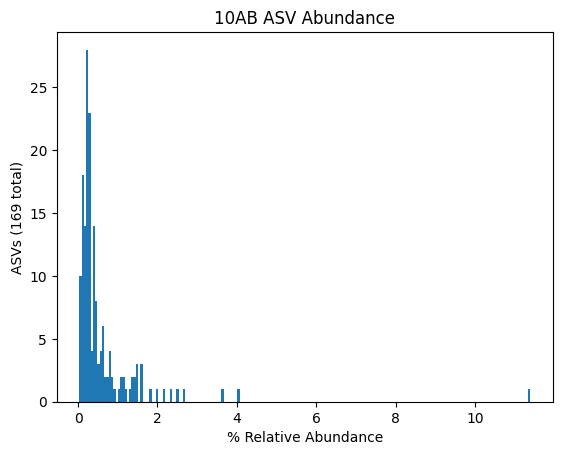

A34


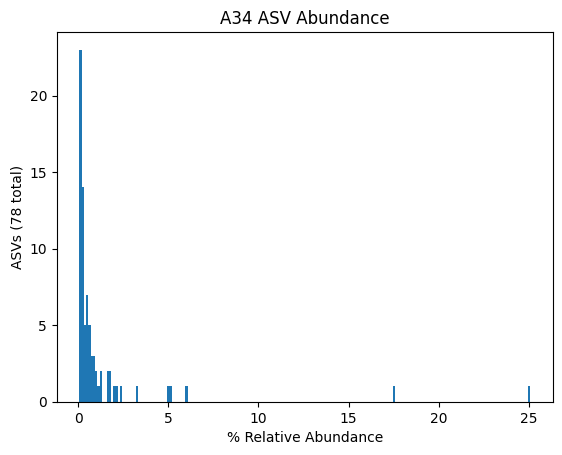

B34


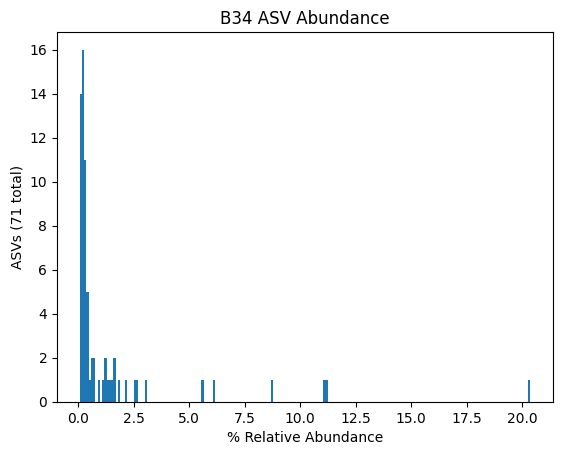

C3


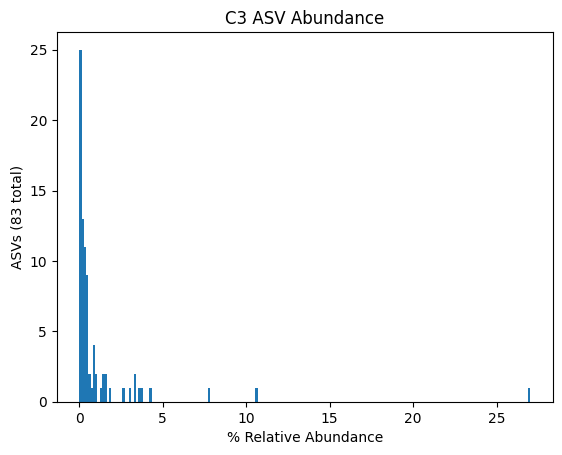

D34


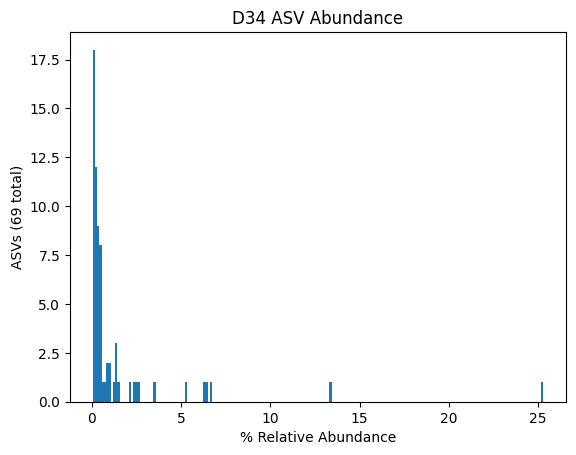

E34


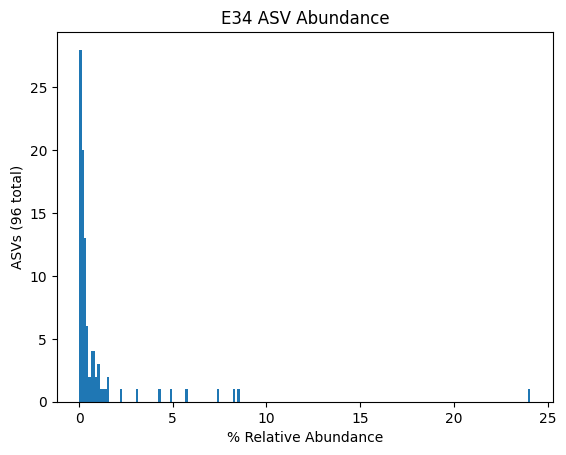

F34


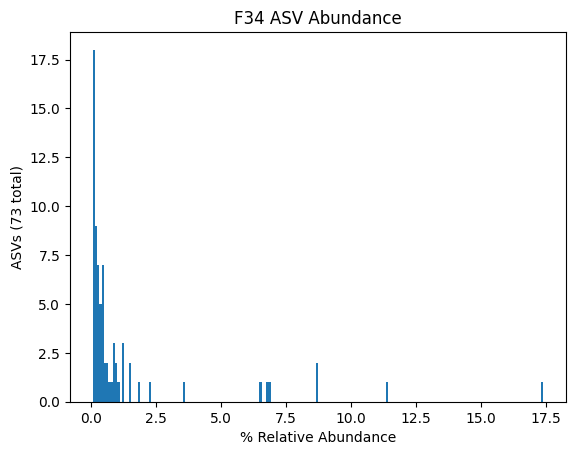

G12


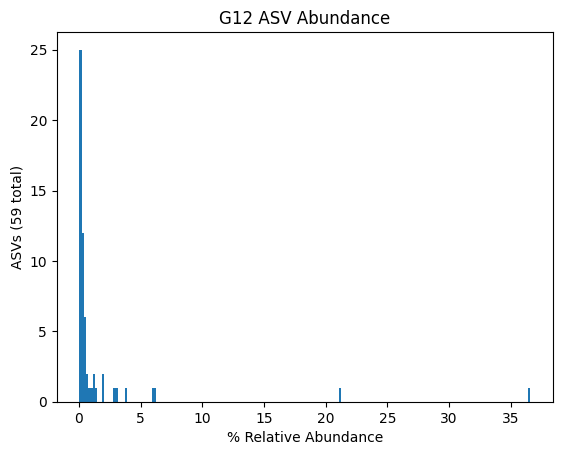

G3


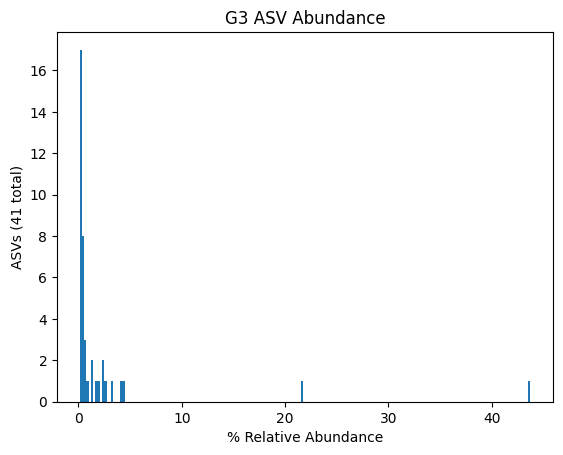

H34


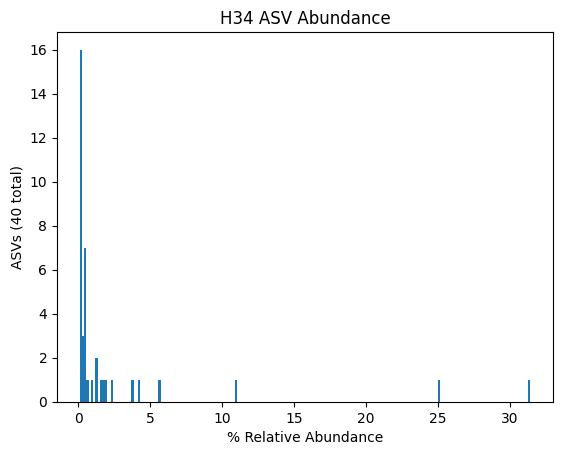

I34


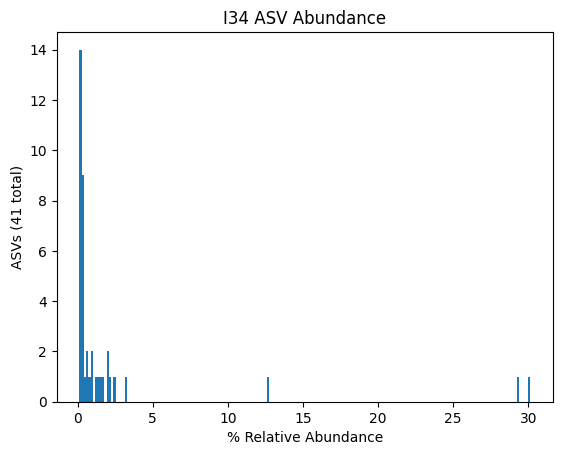

J12


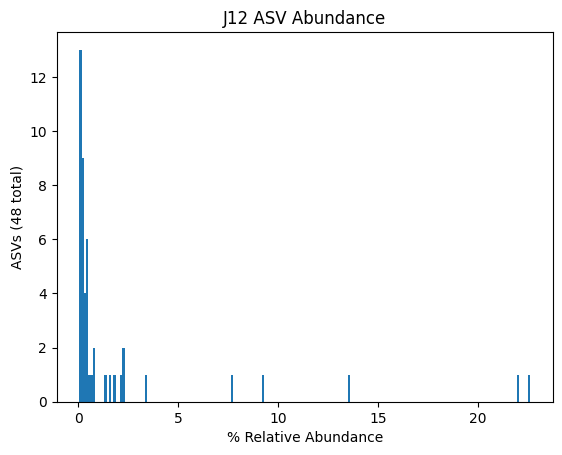

J34


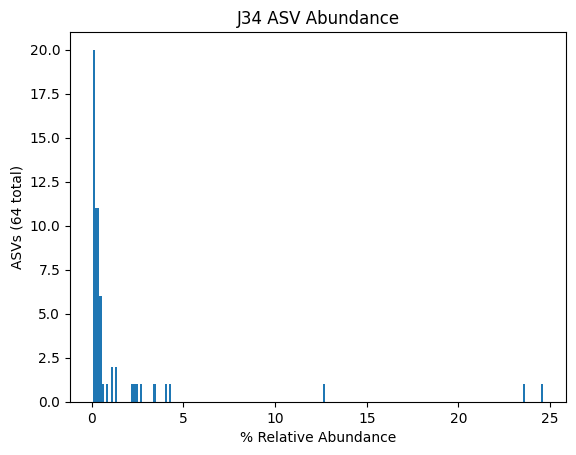

K12


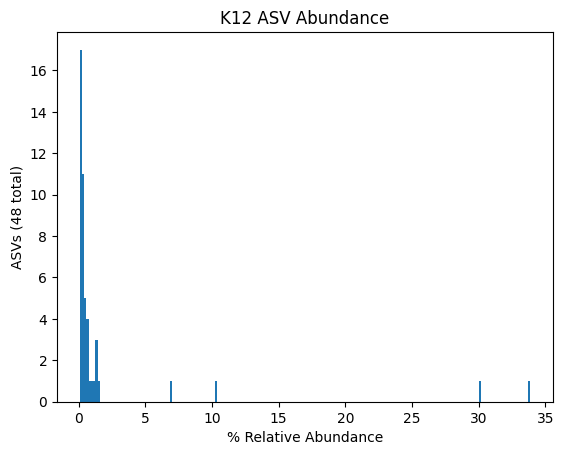

L12


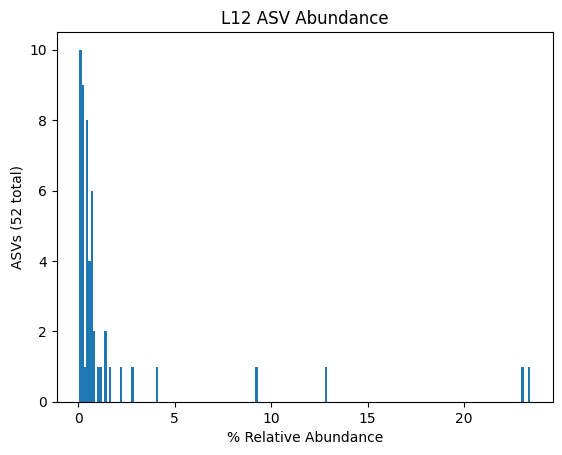

M12


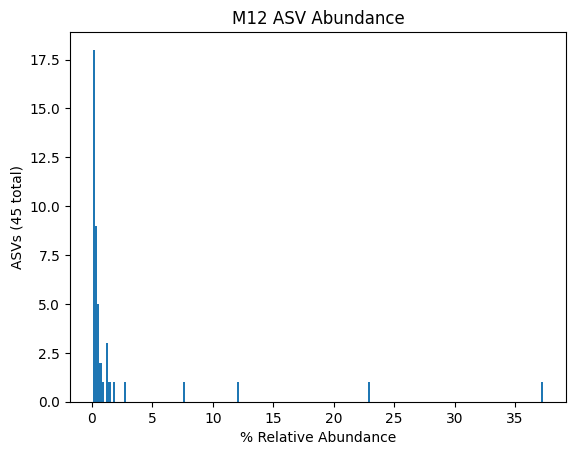

N12


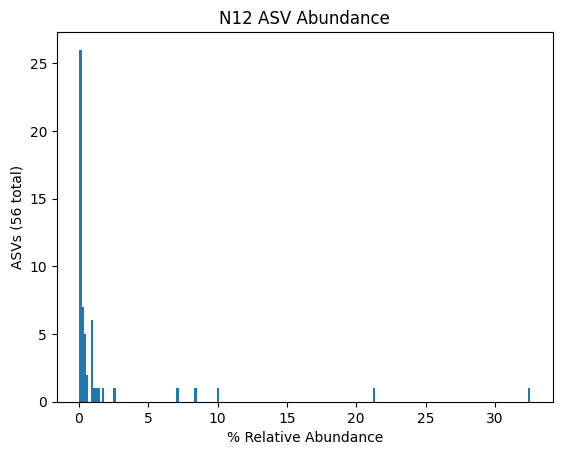

P12


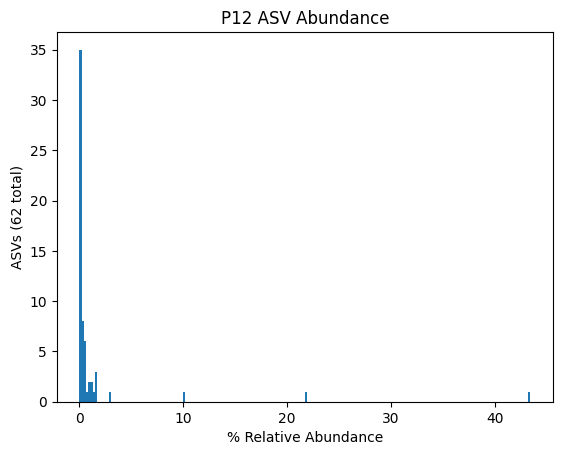

In [ ]:
from matplotlib import pyplot as plt

from numpy import array 
for sample, content in ab_js.items(): 
    print(sample)
    abundances = array([x for x in list(content.values()) if x > 0])
    # print(len(abundances))

    plt.hist(abundances, bins=200)

    # Add labels and title
    plt.xlabel('% Relative Abundance')
    plt.ylabel(f'ASVs ({len(abundances)} total)')
    plt.title(f'{sample} ASV Abundance')

    # Display the plot
    plt.savefig(f'abundance_distributions/{sample}_abundance.png')
    plt.show()

## abundance heatmap

/var/folders/j8/f5pb70wx5gn1qv1nz77lfhyr0000gn/T/ipykernel_72662/4072056150.py:133: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_og["rel_ab"] = sample_og["rel_ab"] / sample_og["rel_ab"].sum()


0.43743482794577704
[0, np.float64(0.01), np.float64(0.0266072505979881), np.float64(0.0707945784384138), np.float64(0.18836490894898), np.float64(0.5011872336272722)]
0 0.01
0.01 0.0266072505979881
0.0266072505979881 0.0707945784384138


/Users/andrewfreiburger/Documents/venv_microbiome_stable/lib/python3.11/site-packages/seaborn/matrix.py:715: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  self._figure = plt.figure(figsize=figsize)


0.0707945784384138 0.18836490894898
0.18836490894898 0.5011872336272722


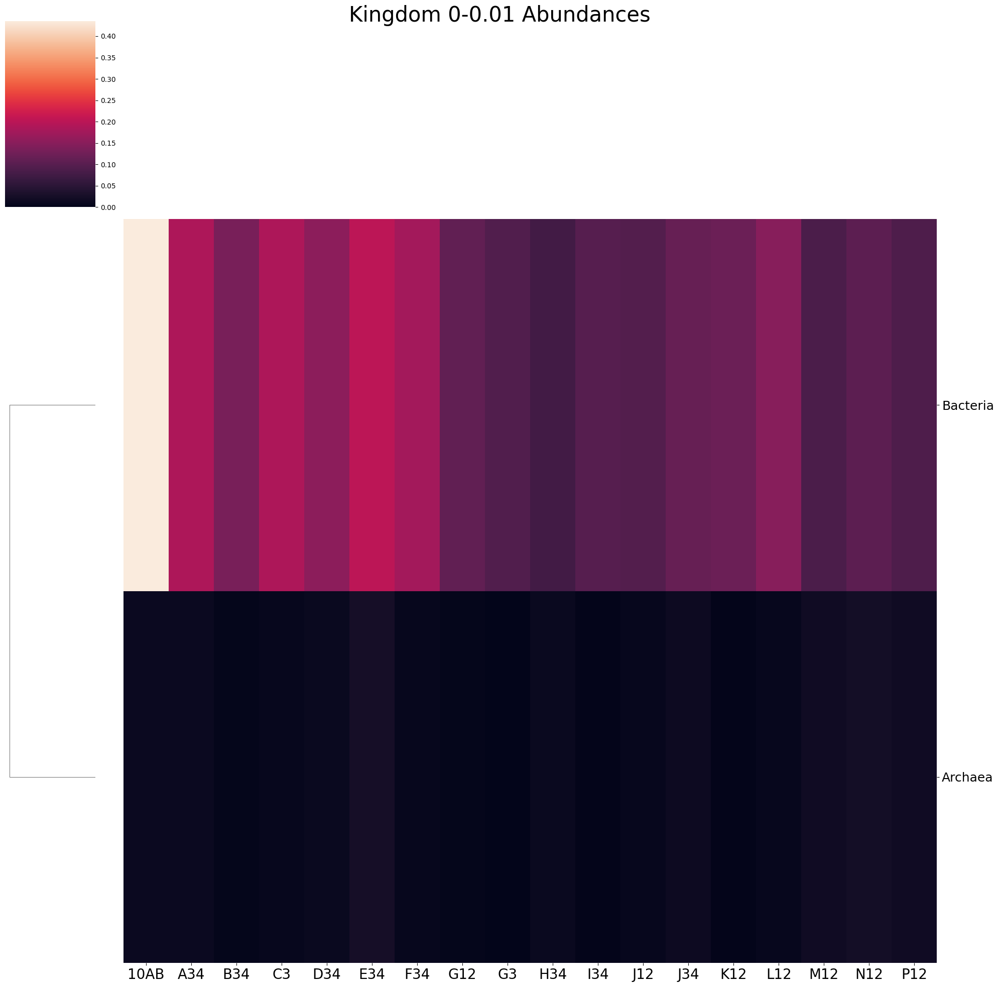

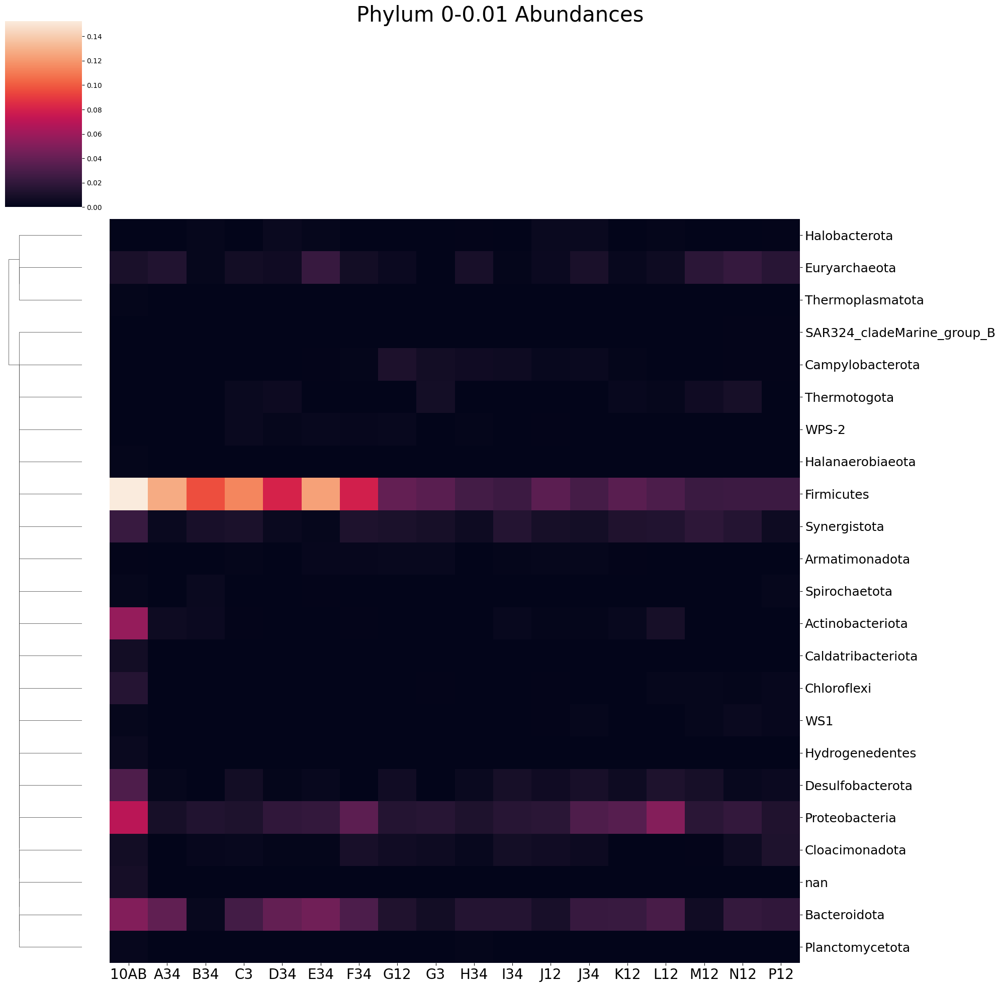

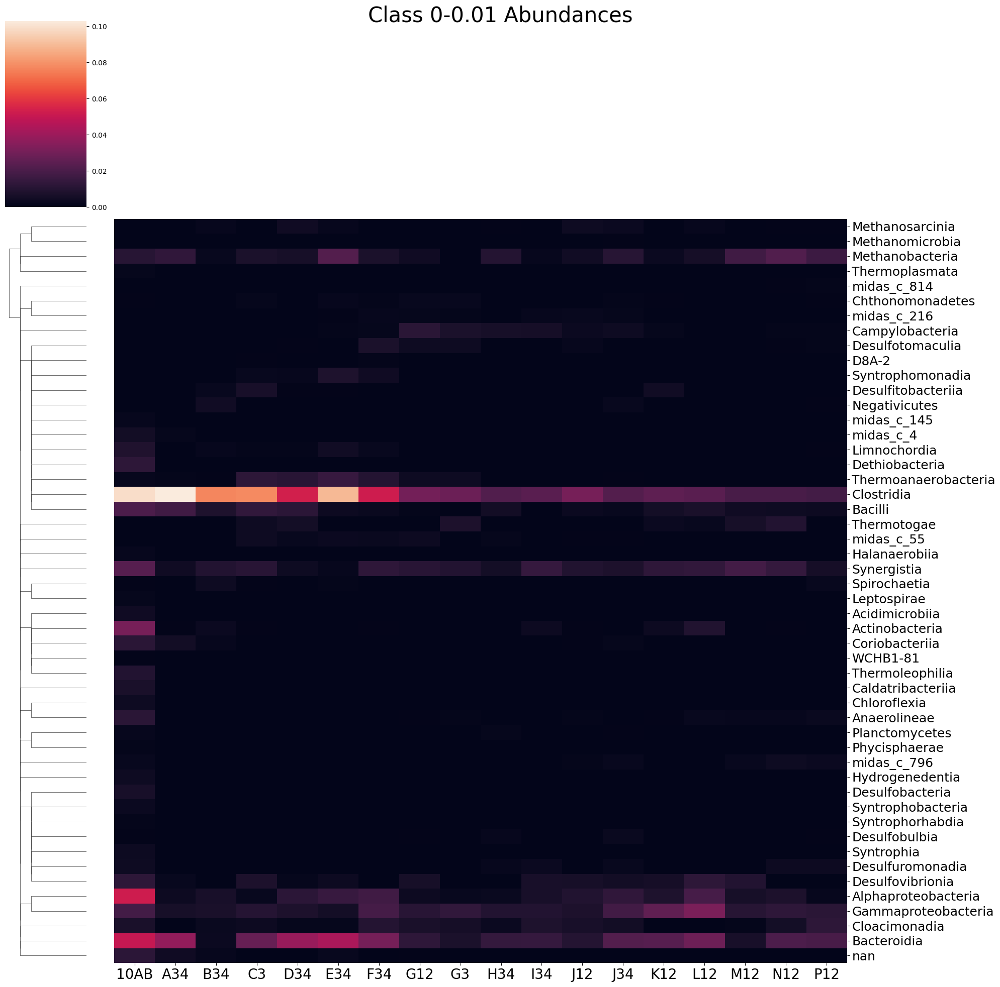

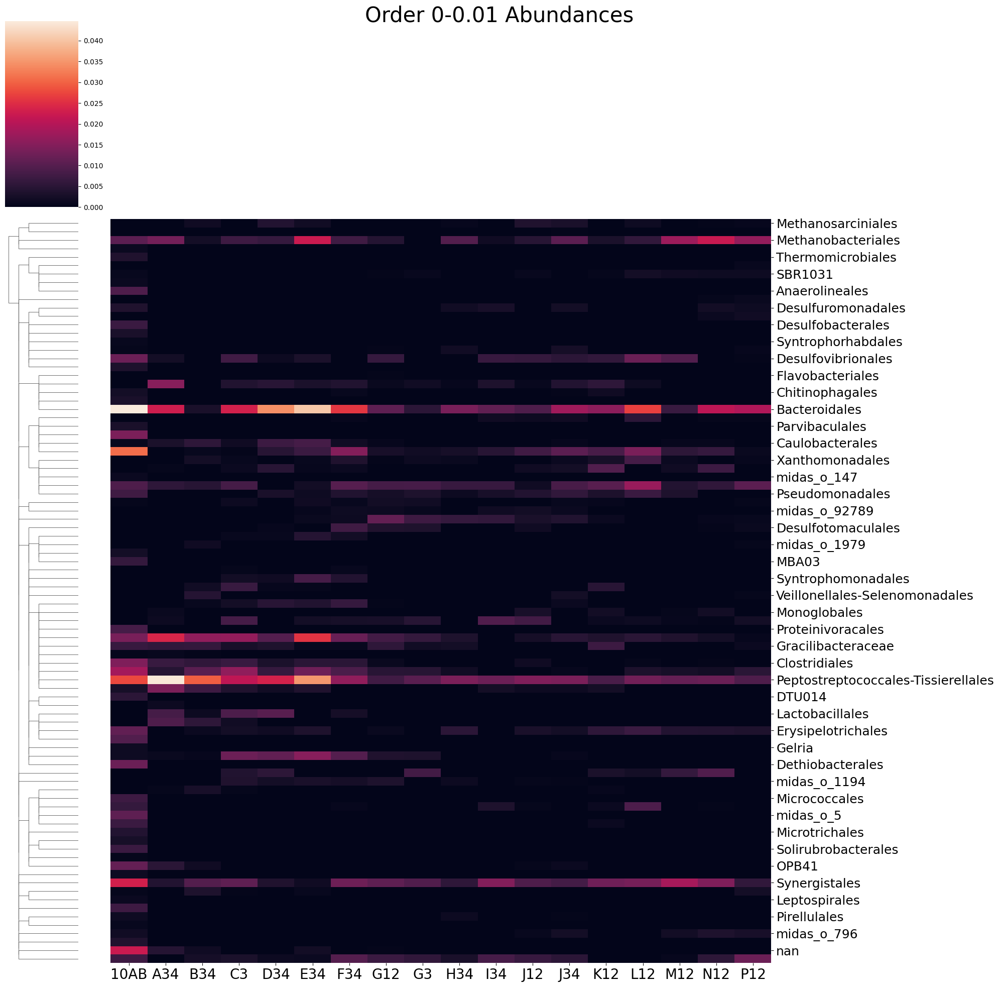

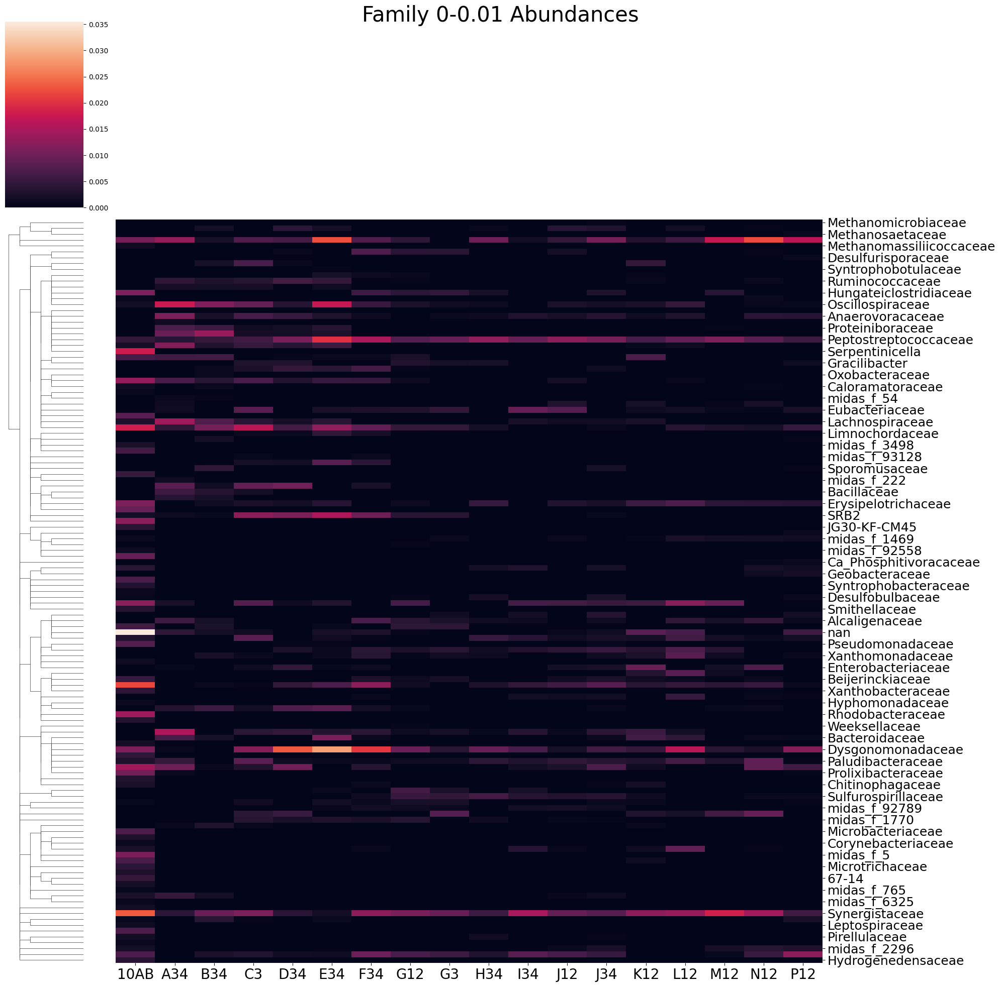

...

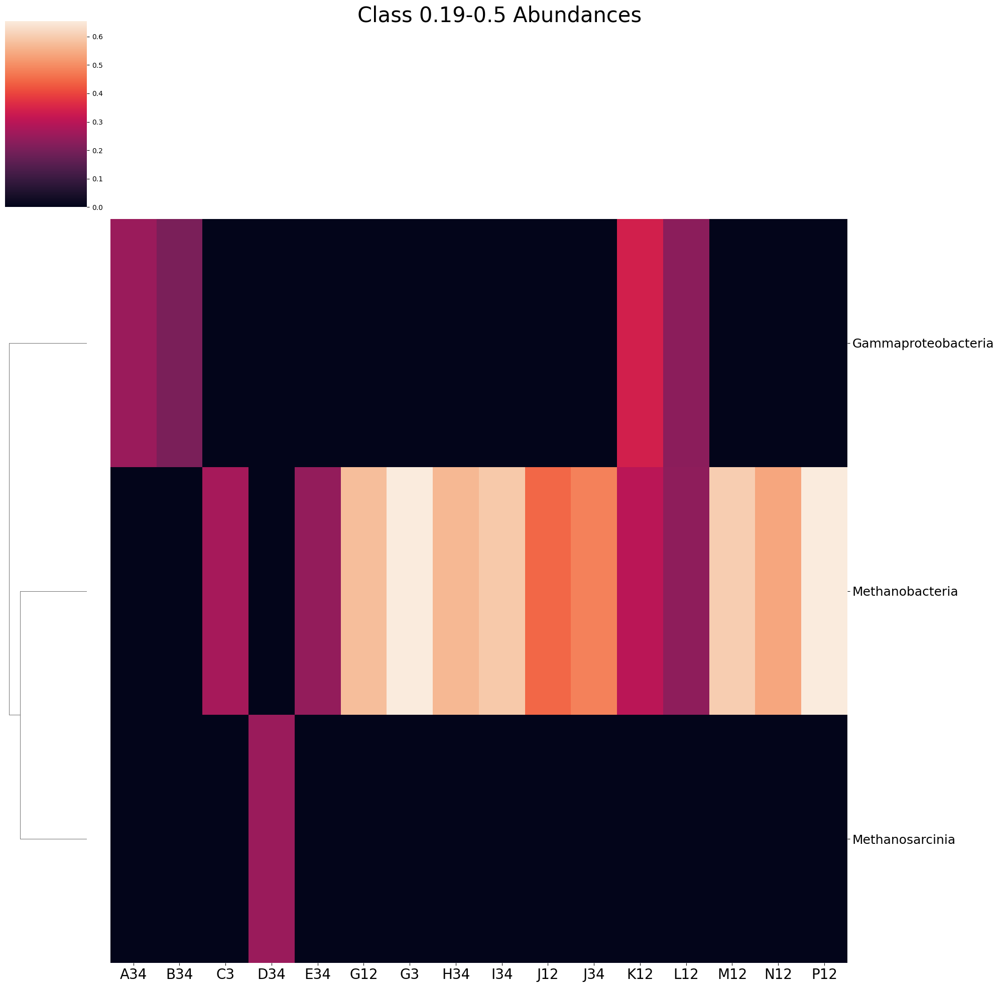

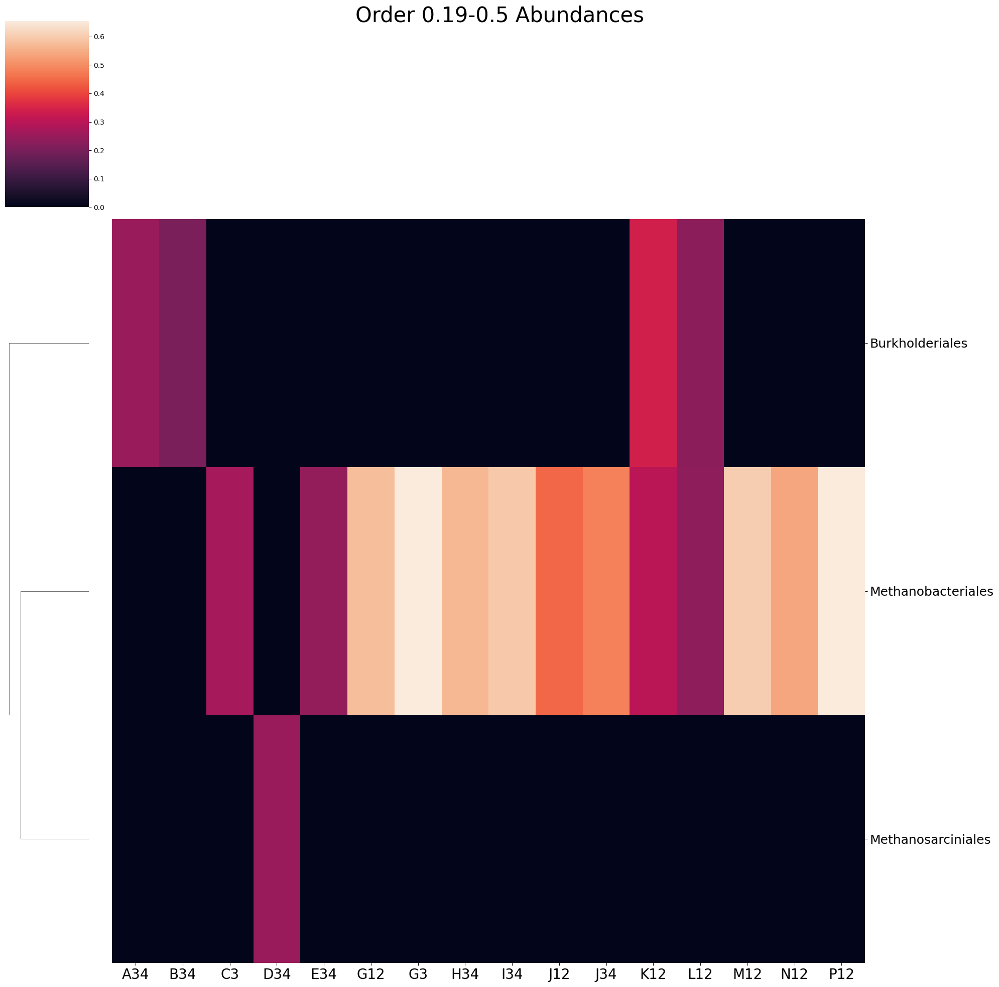

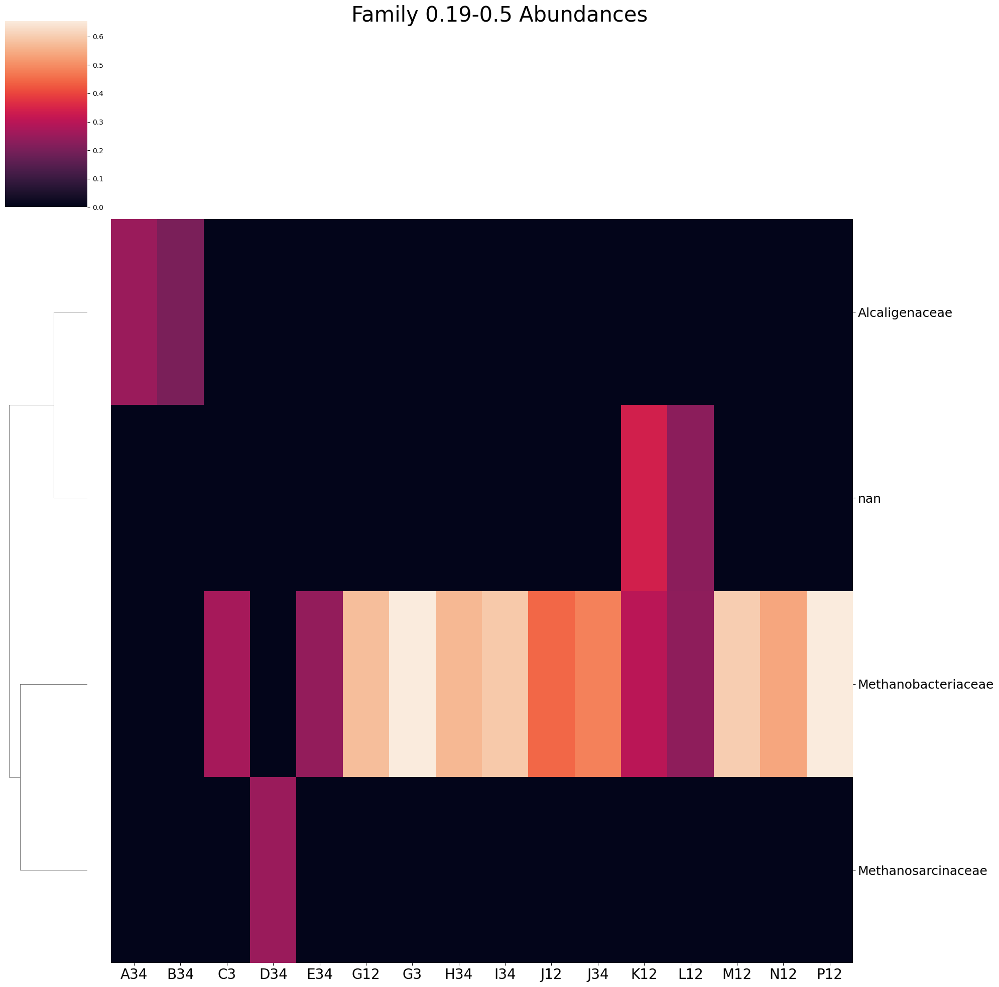

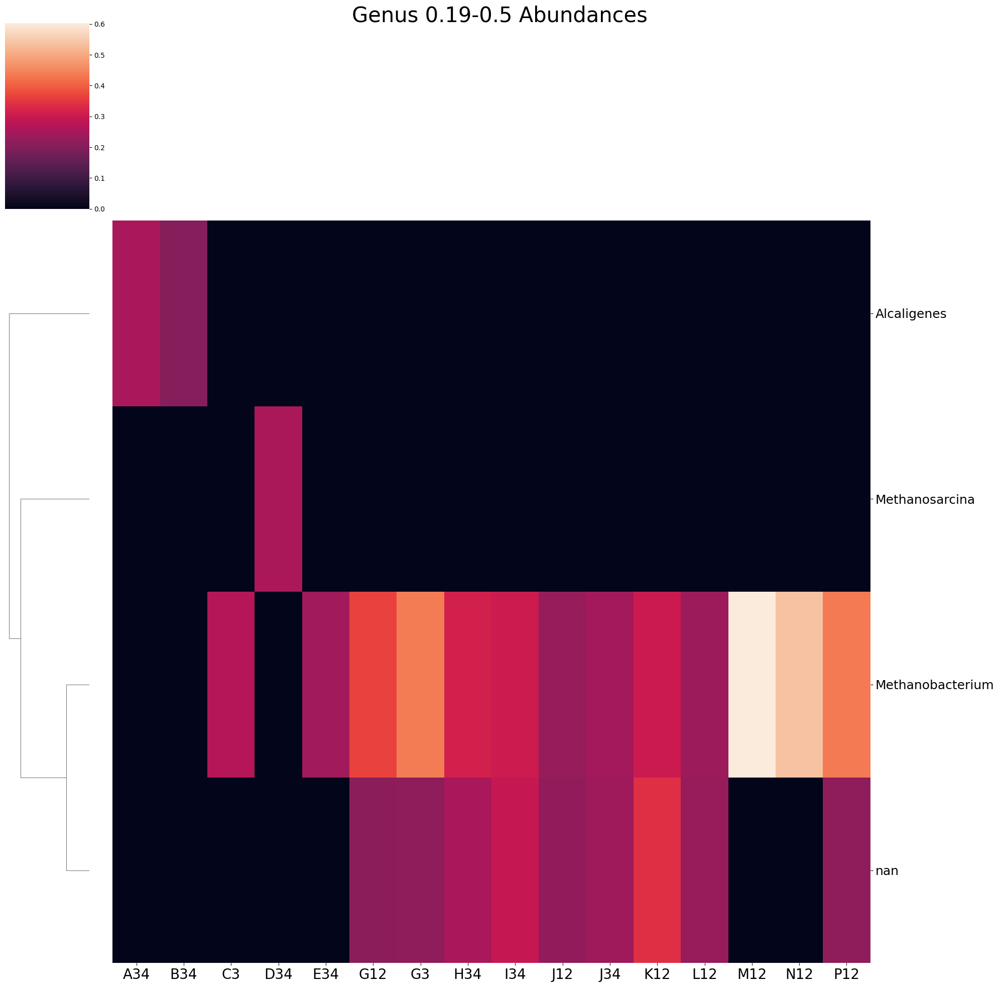

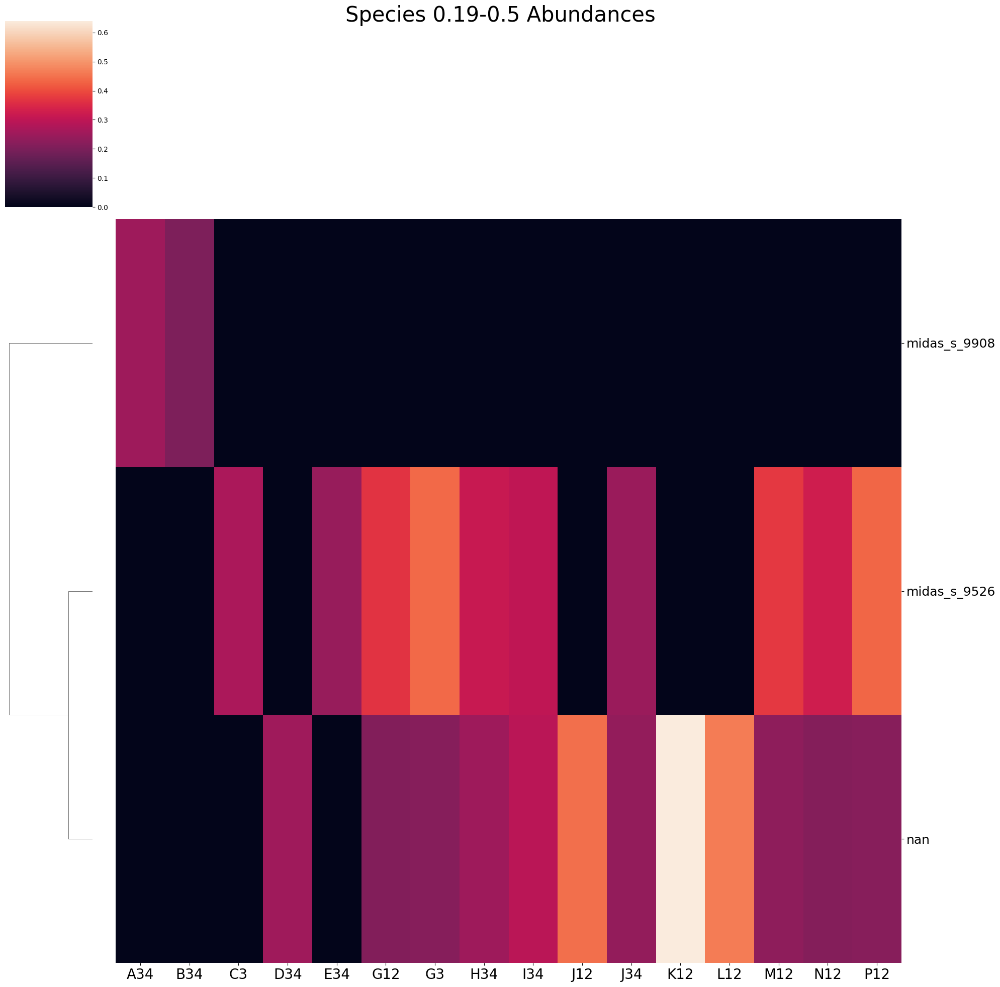

In [ ]:
from pandas import read_csv, DataFrame, Series, concat
import seaborn as sns
from matplotlib import pyplot
from json import load
from numpy import inf, nan, empty, logspace
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage
from collections import Counter

# taxonomy = load(open("/Users/andrewfreiburger/Documents/Research/MicrobiomeNotebooks/digestor/new_abundances.json", 'r'))

def taxonomy_linkage(taxonomy_series, ranks=('kingdom','phylum','class','order','family','genus','species'),
                     method: str = 'average'):
    """
    Build a SciPy linkage matrix from a taxonomy Series by defining
    a simple distance: (#ranks) - (#equal ranks at the same positions).

    Parameters
    ----------
    taxonomy_series : pd.Series
        Index order must match df.index (rows). Values are taxonomy strings
        like "k__Bacteria;p__Firmicutes;c__Bacilli;...".
    ranks : tuple or int
        Number of ranks considered. If tuple, its length is used.
    method : str
        Linkage method for scipy.cluster.hierarchy.linkage.

    Returns
    -------
    Z : np.ndarray
        Linkage matrix suitable for seaborn.clustermap(row_linkage=Z).
    """
    # Normalize rank count
    ranks_n = len(ranks) if not isinstance(ranks, int) else int(ranks)

    # Split and standardize to fixed-length lists (pad/truncate)
    parts = (
        taxonomy_series.fillna("")
        .astype(str)
        .str.split(r"[;|,]", regex=True)
        .apply(lambda lst: [x.strip() for x in (lst or [])])
        .apply(lambda lst: (lst + [""] * ranks_n)[:ranks_n])
    )

    n = len(parts)
    if n <= 1:
        # Nothing to cluster; return empty linkage
        return empty((0, 4), dtype=float)

    # Build condensed distance vector: distance = ranks_n - (#equal positions)
    D_condensed = []
    for i in range(n - 1):
        ai = parts.iloc[i]  # POSitional access fixes KeyError
        for j in range(i + 1, n):
            aj = parts.iloc[j]
            same = sum(a == b and a != "" and b != "" for a, b in zip(ai, aj))
            D_condensed.append(ranks_n - same)

    # Convert to linkage (hierarchical clustering tree)
    Z = linkage(D_condensed, method=method)
    return Z


def concatenate_taxonomy(df, level):
    dic = {}
    for index, row in df.iterrows():
        dic["|".join([str(row[l]) for l in taxonomic_levels
                    if taxonomic_levels.index(l) <= taxonomic_levels.index(level)])] = index
    return Series(dic)

def change_columns(df):
    return df[[c for c in sample_order if c in df.columns]]


from matplotlib.colors import LinearSegmentedColormap

# Define a single-color gradient colormap (white → blue)
blue_cmap = LinearSegmentedColormap.from_list("blueMap", [(0, "black"), (1, "skyblue")])


from pandas import read_excel
from json import dump
# ab = read_csv("GAME Sequencing/ASV_abundance_wideform.csv").set_index("seq")
taxonomic_levels = ["Kingdom", "Phylum", "Class", "Order", "Family", "Genus", "Species"]
sample_order = ["10AB", "A34", "B34", "C3", "D34", "E34", "F34", "G12", "G3", "H34", "I34",
                "J12", "J34", "K12", "L12", "M12", "N12", "P12"]
og = read_excel("/Users/andrewfreiburger/Documents/Research/MicrobiomeNotebooks/digestor/Abundance Sep 17 2025.xlsx").set_index("seq")
sample_dfs = []
for sample in sample_order:
    sample_og = og[og["sample"] == sample]
    # display(sample_og)
    sample_og["rel_ab"] = sample_og["rel_ab"] / sample_og["rel_ab"].sum()
    sample_dfs.append(sample_og)
og = concat(sample_dfs)
# og["rel_ab"] /= og["rel_ab"].sum()
max_abundance = og["rel_ab"].max()
print(max_abundance)
# display(og)
intervals = [0] + list(logspace(-2, -.3, 5))
print(intervals)
for i, abundance_limit in enumerate(intervals):
    if abundance_limit == 0:  continue
    previous_limit = intervals[i-1]
    print(previous_limit, abundance_limit)
    abundance_range = f"{round(previous_limit, 2)}-{round(abundance_limit, 2)}"
    for level in taxonomic_levels:
        ab = og.copy()
        # ab = ab.set_index(level).drop([l for l in taxonomic_levels if l != level], axis=1)#.groupby(level).sum()
        # display(ab)

        dic = {}
        taxonomies = {}
        for seq, row in ab.iterrows():
            abundance = row["rel_ab"]
            # print(abundance)
            if abundance <= previous_limit or abundance > abundance_limit:  continue
            # asvs_used.append(row["seq"])
            taxonomies[row[level]] = "|".join([str(row[l]) for l in taxonomic_levels
                                if taxonomic_levels.index(l) <= taxonomic_levels.index(level)])
            # taxonomies.append("|".join([str(row[l]) for l in taxonomic_levels
            #                     if taxonomic_levels.index(l) <= taxonomic_levels.index(level)]))
            dic.setdefault(row["sample"], {})
            dic[row["sample"]].setdefault(row[level], 0)
            dic[row["sample"]][row[level]] += abundance

        # display(dic)
        if dic == {}:
            print(f"The {level} does not have organisms in {abundance_range}")
            continue
        elif len(taxonomies) == 1:
            print(f"The {level} only has one organism in {abundance_range}:  {dic} and {taxonomies}")
            continue

        df = change_columns(DataFrame(dic))
        df = df.astype(float).replace([inf, -inf], nan).fillna(0)
        # display(df)
        # clustermap = ClusterHeatmap(df, level, ) # Series(dict(Counter(taxonomies))))
        clusterMap = sns.clustermap(df, 
                                    # row_colors=row_colors,
                                    # cmap=blue_cmap,
                                    # vmin=0,
                                    # vmax=max_abundance,
                                    col_cluster=False, figsize=(20, 20),
                                    row_linkage=taxonomy_linkage(Series(taxonomies)),
                                    dendrogram_ratio=(.1, .2))
        clusterMap.figure.subplots_adjust(bottom=0.15, top=0.95)  # Adjust these values as needed to fit labels
        clusterMap.figure.suptitle(f"{level.capitalize()} {abundance_range} Abundances", fontsize=30)
        clusterMap.ax_heatmap.set_yticklabels(clusterMap.ax_heatmap.get_yticklabels(), fontsize=18, rotation=0)
        clusterMap.ax_heatmap.set_xticklabels(clusterMap.ax_heatmap.get_xticklabels(), fontsize=20)
        clusterMap.figure.tight_layout()
        clusterMap.figure.savefig(f"abundance_heatmaps/{level}_{abundance_range}_abundances.png")
    # break

In [12]:
# import csv
# import numpy as np
# from collections import Counter
# from matplotlib import pyplot as pyplot

# with open("C:/Users/danie/OneDrive/Desktop/GAME Sequencing/GAME_Metadata.csv") as csv_file:
#     csv_reader = csv.DictReader(csv_file)


## functional Grouping and taxonomy 

In [13]:
# {
#     'Archaea': {
#         "Euryarchaeota": {
#             "Hydrogenotrophic/Acetoclastic": "Y",
#             "Methanobacteria": {
#                 "Methanobacteriales":{
#                     "Methanobacteriaceae":{
#                         "Methanobacterium":{
#                             "Methanobacterium_beijingense": {

#                             }, 
#                             "midas_3006": {

#                             }
#                         }
#                     }
#                 }

#             }

#         }
#     }
# }

## ploting from chat

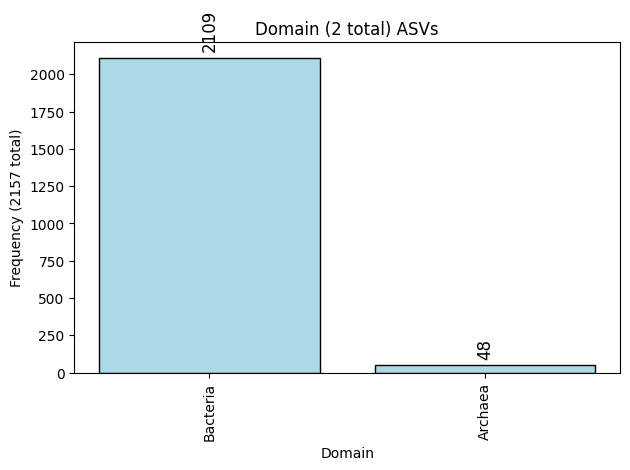

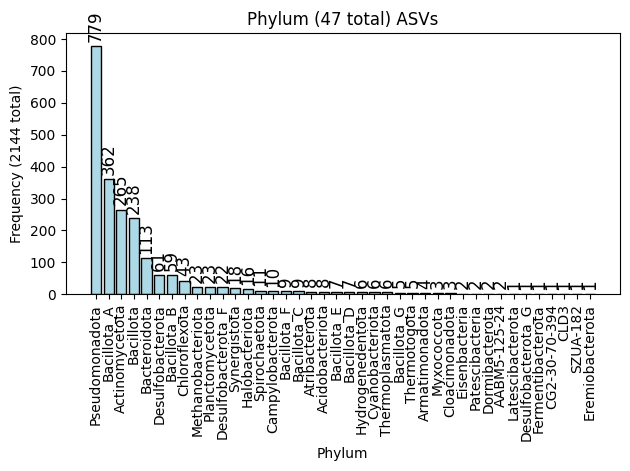

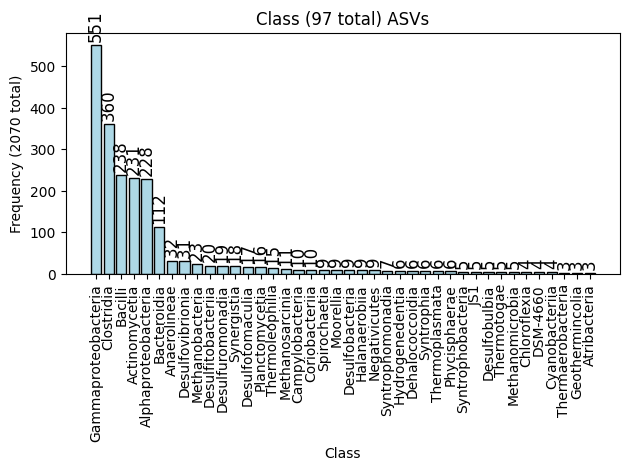

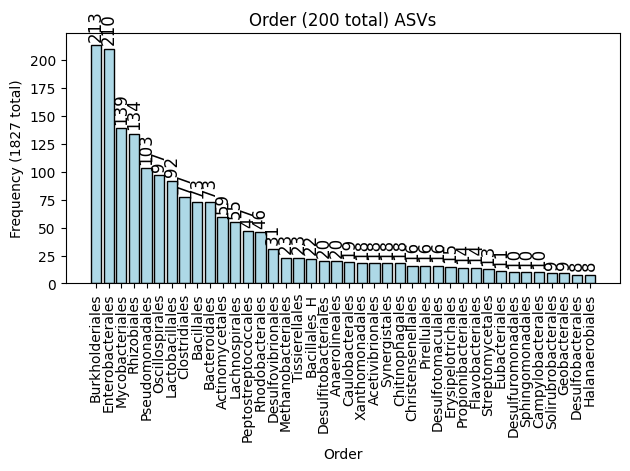

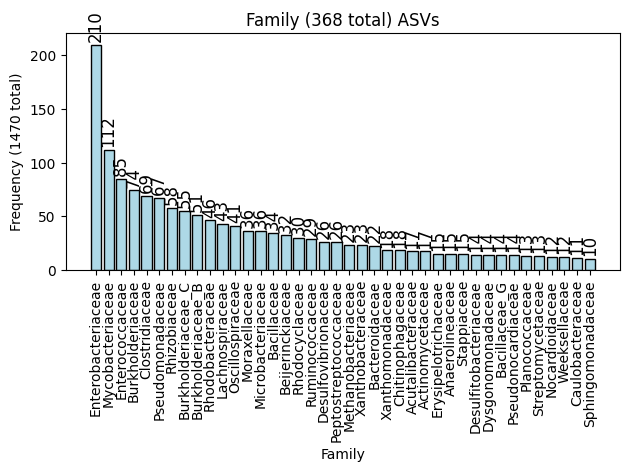

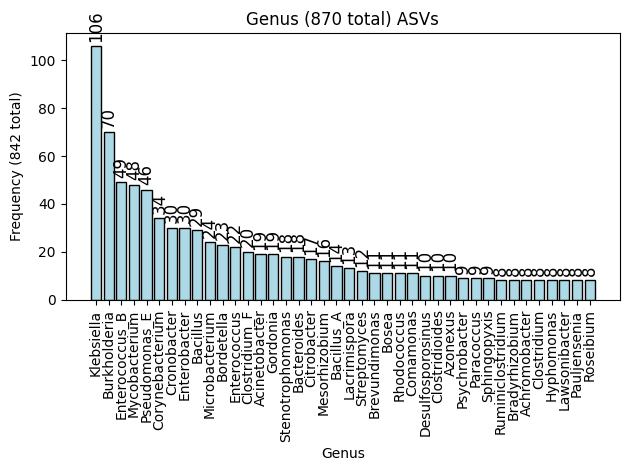

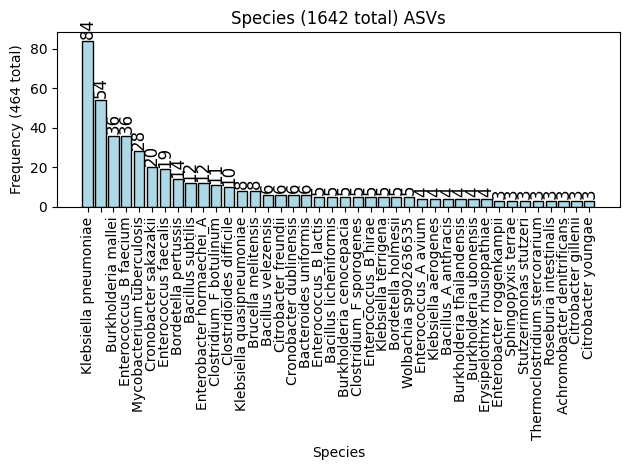

In [5]:
def taxa_bar_chart(taxa_asvs, x_label, title, export_name):
    # Create the bar chart
    limit_size = 40
    sorted_data = dict(sorted({k:len(x) for k,x in taxa_asvs.items()}.items(), key=lambda x: x[1], reverse=True))
    sorted_data = dict(list(sorted_data.items())[:limit_size])
    plt.bar(list(sorted_data.keys()), list(sorted_data.values()), color='lightblue', edgecolor='black')

    # Add labels on top of each bar
    for i, value in enumerate(list(sorted_data.values())):
        plt.text(i, value + max(list(sorted_data.values()))/30, str(value), ha='center', fontsize=12, color='black', rotation=90)

    # Add labels and title
    plt.xlabel(x_label)
    plt.ylabel(f"Frequency ({sum(list(sorted_data.values()))} total)")
    plt.title(title)

    # Rotate x-axis labels if needed
    plt.xticks(rotation=90)

    # Show the plot
    plt.tight_layout()
    plt.savefig(export_name)
    plt.show()


from numpy import nan
import matplotlib.pyplot as plt
def define_taxa_asvs(taxa, full_taxonomy):
    taxa_asvs = {}
    for asv, taxonomy in full_taxonomy.items():
        if str(taxonomy.get(taxa, 'none')) in [nan, "nan", "NaN", "none", "None"] or "midas" in taxonomy.get(taxa, 'none'):
            continue
        if taxonomy.get(taxa, 'none') not in taxa_asvs:
            taxa_asvs[taxonomy.get(taxa, 'none')] = []
        taxa_asvs[taxonomy.get(taxa, 'none')].append(asv)
    return taxa_asvs

from json import load
gtdb_taxonomy = load(open("/Users/andrewfreiburger/Documents/Research/sludge/gtdb_taxonomy.json", 'r'))
levels =  ["Domain", "Phylum", "Class", "Order", "Family", "Genus", "Species"]
for taxa in levels:
    taxa_asvs = define_taxa_asvs(taxa, gtdb_taxonomy)
    taxa_bar_chart(taxa_asvs, taxa,
        f"{taxa} ({len(taxa_asvs)} total) ASVs", f"gtdb_taxonomic_representations/{taxa}_asvs.png")

# from deepdiff import DeepDiff
# for taxa in levels:
#     for sample, content in ab_js.items():
#         full_taxonomy = {k:taxonomy_js[k] for k, v in content.items() if v > 0}
#         # display(DeepDiff(taxonomy_js, full_taxonomy))
#         taxa_asvs = define_taxa_asvs(taxa, full_taxonomy)
#         taxa_bar_chart(taxa_asvs, taxa,
#             f"{sample} {taxa} ({len(taxa_asvs)} total) ASVs", f"gtdb_taxonomic_representation/{sample}_{taxa}_asvs.png")
        # break

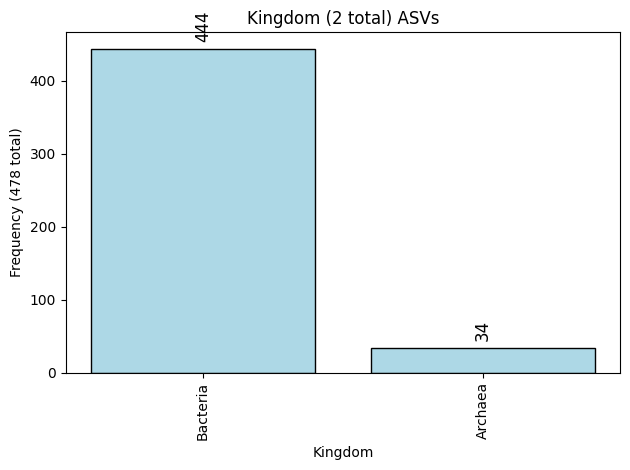

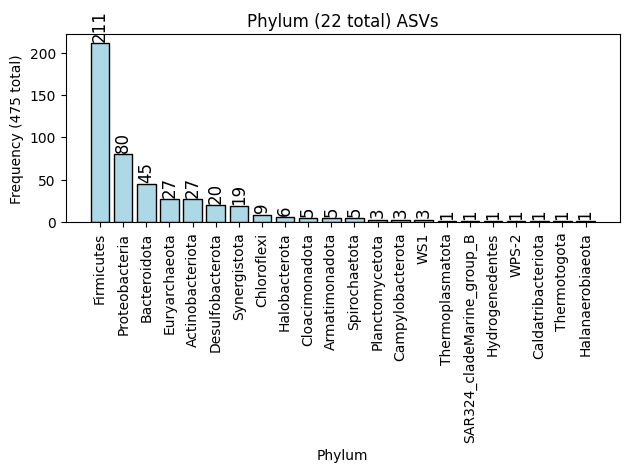

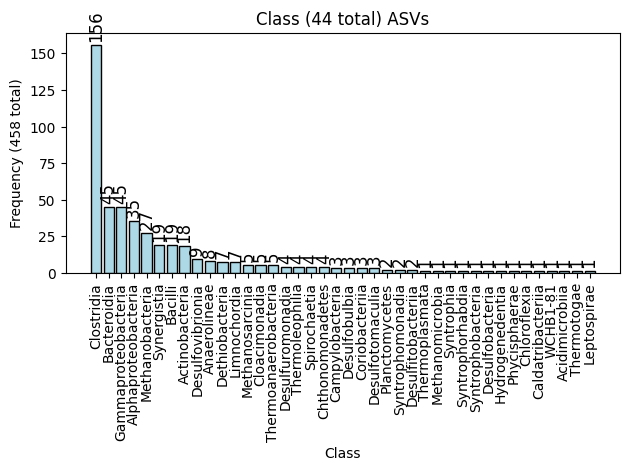

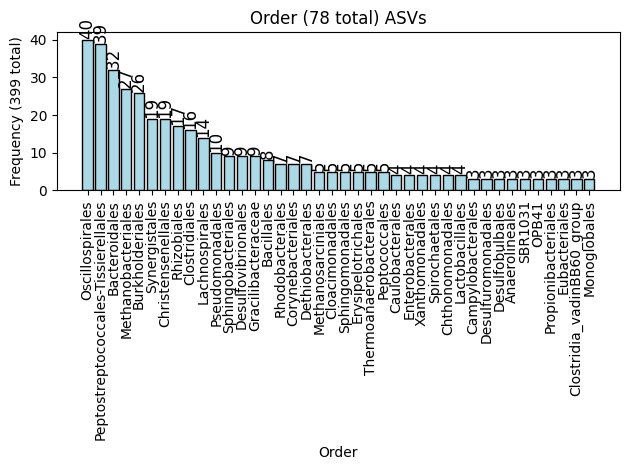

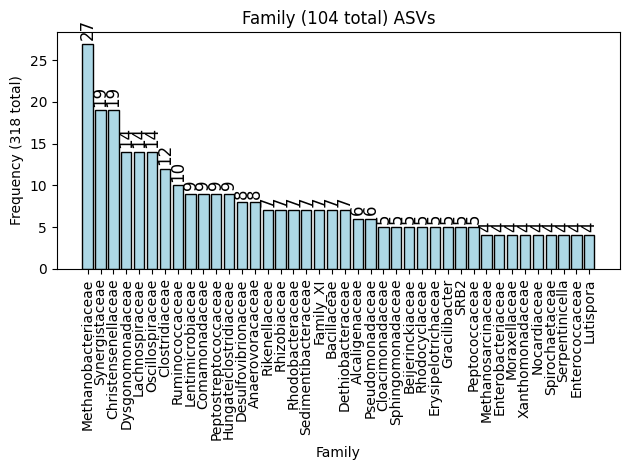

...

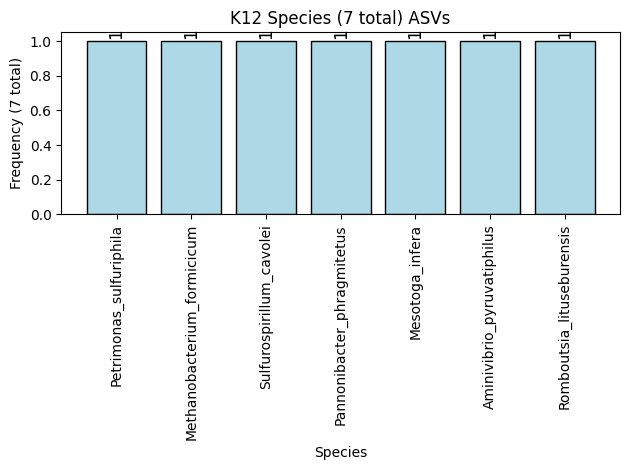

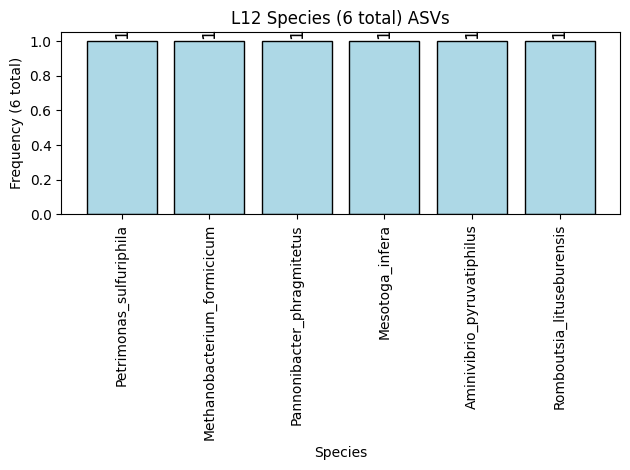

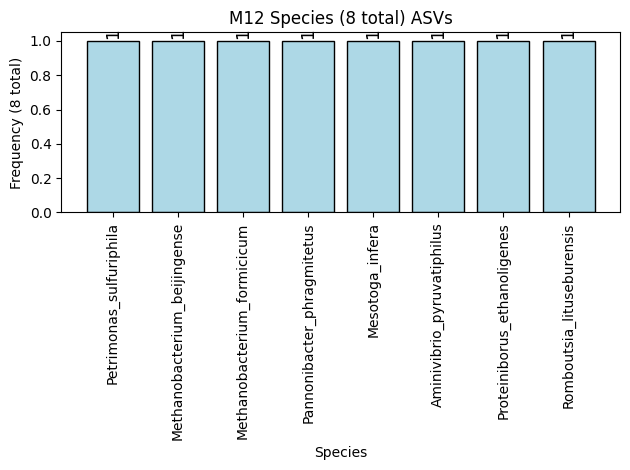

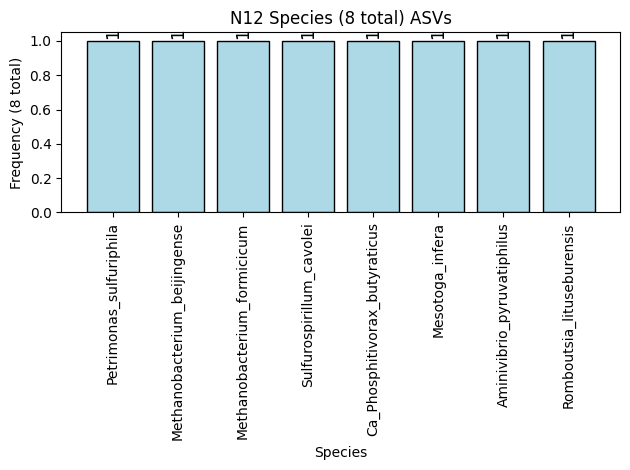

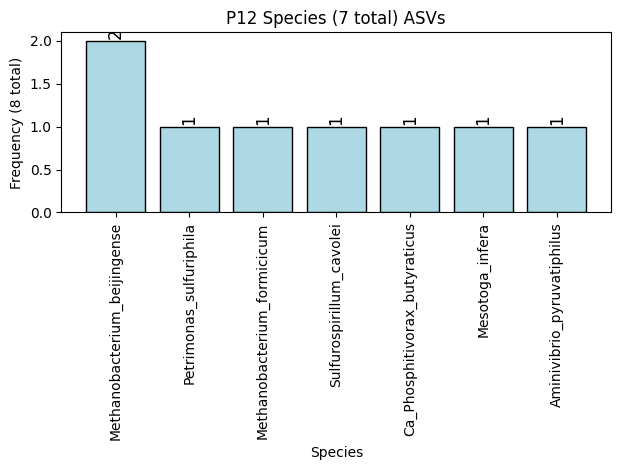

In [49]:
def taxa_bar_chart(taxa_asvs, x_label, title, export_name):
        # Create the bar chart
        limit_size = 40
        sorted_data = dict(sorted({k:len(x) for k,x in taxa_asvs.items()}.items(), key=lambda x: x[1], reverse=True))
        sorted_data = dict(list(sorted_data.items())[:limit_size])
        plt.bar(list(sorted_data.keys()), list(sorted_data.values()), color='lightblue', edgecolor='black')

        # Add labels on top of each bar
        for i, value in enumerate(list(sorted_data.values())):
            plt.text(i, value + max(list(sorted_data.values()))/30, str(value), ha='center', fontsize=12, color='black', rotation=90)

        # Add labels and title
        plt.xlabel(x_label)
        plt.ylabel(f"Frequency ({sum(list(sorted_data.values()))} total)")
        plt.title(title)

        # Rotate x-axis labels if needed
        plt.xticks(rotation=90)

        # Show the plot
        plt.tight_layout()
        plt.savefig(export_name)
        plt.show()


def define_taxa_asvs(taxa, full_taxonomy):
    taxa_asvs = {}
    for asv, taxonomy in full_taxonomy.items():
        if str(taxonomy.get(taxa, 'none')) in [nan, "nan", "NaN", "none", "None"] or "midas" in taxonomy.get(taxa, 'none'):
            continue
        if taxonomy.get(taxa, 'none') not in taxa_asvs:
            taxa_asvs[taxonomy.get(taxa, 'none')] = []
        taxa_asvs[taxonomy.get(taxa, 'none')].append(asv)
    return taxa_asvs


for taxa in ["Kingdom", "Phylum", "Class", "Order", "Family", "Genus", "Species"]:
    taxa_asvs = define_taxa_asvs(taxa, taxonomy_js)
    taxa_bar_chart(taxa_asvs, taxa,
        f"{taxa} ({len(taxa_asvs)} total) ASVs", f"taxonomic_representations/{taxa}_asvs.png")

# from deepdiff import DeepDiff
for taxa in ["Kingdom", "Phylum", "Class", "Order", "Family", "Genus", "Species"]:
    for sample, content in ab_js.items():
        full_taxonomy = {k:taxonomy_js[k] for k, v in content.items() if v > 0}
        # display(DeepDiff(taxonomy_js, full_taxonomy))
        taxa_asvs = define_taxa_asvs(taxa, full_taxonomy)
        taxa_bar_chart(taxa_asvs, taxa,
            f"{sample} {taxa} ({len(taxa_asvs)} total) ASVs", f"taxonomic_representations/{sample}_{taxa}_asvs.png")
        # break

In [16]:
#Visualizin Functionality

ft = read_csv('C:/Users/danie/OneDrive/Desktop/GAME Sequencing/FunctionalityTable_Genus.csv').set_index('seq')
display(ft)

# ft.to_json('Functionality.json')

# ft_js=load(open('Functionality.json', 'r'))
# ft_js.keys()

# ft_js

new_dict = {}
for seq, row in ft.iterrows():
    sample = row["sample"]
    if sample not in new_dict:
         new_dict[sample] = {}
    new_dict[sample][seq] = {
          "genus": row["Genus"],
          "metabolism": row["Metabolism"],
          "abundance": row["sum_ab"]
     }
from json import dump
dump(new_dict, open("Functionalities.json", 'w'), indent=3)

In [17]:
sample_met = {}
for sample, content in new_dict.items():
    metabolisms = {}
    for sequnce, content2 in content.items():
        met = content2["metabolism"]
        if met not in metabolisms:
            metabolisms[met] = []
        metabolisms[met].append(content2["abundance"])
    sample_met[sample] = metabolisms

#display(sample_met)
    
for sample, metabolisms in sample_met.items():
    print(sample)
    for met, abundances in metabolisms.items():

        print(met, len(abundances), sum(abundances))
    print()

sample_met

1AB
Hydrogenotroph/Acetoclastic 7 23.84522370012094
Acetogen 4 0.0
nan 3 0.0
Hydrogenotroph/Formate 2 0.0
Hydrogenotroph 1 0.0

3AB
Hydrogenotroph/Acetoclastic 7 6.408636124275931
Acetogen 4 0.0
nan 3 0.0
Hydrogenotroph/Formate 2 0.0
Hydrogenotroph 1 0.0

4AB
Hydrogenotroph/Acetoclastic 7 0.0282386163078009
Acetogen 4 0.0
nan 3 0.0
Hydrogenotroph/Formate 2 0.0
Hydrogenotroph 1 0.0

5AB
Acetogen 4 0.0
nan 3 0.0
Hydrogenotroph/Acetoclastic 7 0.0
Hydrogenotroph/Formate 2 0.0
Hydrogenotroph 1 0.0

6AB
Hydrogenotroph/Acetoclastic 7 2.44969378827647
Acetogen 4 0.0
nan 3 0.0
Hydrogenotroph/Formate 2 0.0
Hydrogenotroph 1 0.0

7AB
Hydrogenotroph/Acetoclastic 7 16.64448511063046
Hydrogenotroph/Formate 2 0.16636167027117
Hydrogenotroph 1 0.124771252703377
Acetogen 4 0.0499085010813509
nan 3 0.0

2AB
Acetogen 4 1.1537696439228187
nan 3 0.5868311119952258
Hydrogenotroph/Formate 2 0.477421921623235
Hydrogenotroph/Acetoclastic 7 0.218818380743982
Hydrogenotroph 1 0.0



{'1AB': {'Hydrogenotroph/Acetoclastic': [13.4945586457074,
   9.01451027811366,
   0.912938331318017,
   0.399032648125756,
   0.0241837968561064,
   0.0,
   0.0],
  'Acetogen': [0.0, 0.0, 0.0, 0.0],
  nan: [0.0, 0.0, 0.0],
  'Hydrogenotroph/Formate': [0.0, 0.0],
  'Hydrogenotroph': [0.0]},
 '3AB': {'Hydrogenotroph/Acetoclastic': [3.77567140600316,
   2.14849921011058,
   0.363349131121643,
   0.121116377040548,
   0.0,
   0.0,
   0.0],
  'Acetogen': [0.0, 0.0, 0.0, 0.0],
  nan: [0.0, 0.0, 0.0],
  'Hydrogenotroph/Formate': [0.0, 0.0],
  'Hydrogenotroph': [0.0]},
 '4AB': {'Hydrogenotroph/Acetoclastic': [0.0282386163078009,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0],
  'Acetogen': [0.0, 0.0, 0.0, 0.0],
  nan: [0.0, 0.0, 0.0],
  'Hydrogenotroph/Formate': [0.0, 0.0],
  'Hydrogenotroph': [0.0]},
 '5AB': {'Acetogen': [0.0, 0.0, 0.0, 0.0],
  nan: [0.0, 0.0, 0.0],
  'Hydrogenotroph/Acetoclastic': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
  'Hydrogenotroph/Formate': [0.0, 0.0],
  'Hydrogenotrop

In [22]:
# Visualizing Process Data 

#These lines extract and convert the operational data for the current system. 
# The Summary file is taken from the Summary tab of the master excel sheet from the project sharepoint.
#  I edited the format slightly to fit python. This data is currently incomplete and needs to be updated.
# The data labelled 2024 is from the current system. This system has been in continuous operation from 2024, and data is still being added. 
# Analyzing this system is our primary goal, but we do not yet have the sequencing data for this system. That data should be available by the end of March 2025. 

op_24 = read_csv("C:/Users/danie/OneDrive/Desktop/GAME Sequencing/2024_Summary.csv").set_index("Days of Operation") 


# Processing into a JSON 


op_24.T.to_json('2024_Data.json')

op_24_js=load(open('2024_Data.json','r'))
op_24_js





{'0.0': {'Influent Flow Rate (mL/min), come back for corrections': 0.154,
  'H2 delivery rate setpoint (mL/min)': 1.0,
  'CO2 delivery rate setpoint (mL/min)': 0.25,
  'H2:CO2 ratio': '4',
  'Average H2 flow rate this period (mL)': None,
  'Average CO2 flow rate this period (mL)': None,
  'Average Gas Flow Rate In (SCCM, T=0C)': 1.364406004,
  'Average Gas Flow Rate Out (SCCM, T=0C)': None,
  '% CH4': 0.0,
  '% H2': 87.58853333,
  '% CO2': 12.41146667,
  'H2 breakthrough (mL/min)': 0.0,
  'CH4 production rate (mL/min), forward projected': 0.0,
  'CH4 (mL)': 0.0,
  'CH4 prod rate (m3/m3d)': 0.0,
  'Target Utilization Rate': 1,
  'via daily CH4 production (%)': '0',
  'via H2 breakthrough (%)': '1',
  'via daily CH4 production (%).1': 0.0,
  'via CO2 breakthrough (%)': None,
  'R-Acetate (reverse projected)': 1608.463377,
  'W-Acetate (reverse projected)': 2240.35856,
  'M-Acetate (forward projected)': 2231.75854,
  '?-Ac (Media to Reactor)': -623.2951633,
  'R-Propionate (reverse projec

In [24]:
# These lines load and reformat the operational data from the 2023 system. 
# The 2023 system did not work well and has been replaced by the 2024 system. 
# The data for this system is much less expansive 
# Genomic data for this system is available, so at present we plan to build a model around it. 

op_23 = read_csv("C:/Users/danie/OneDrive/Desktop/GAME Sequencing/2023_Data.csv").set_index("Day")

op_23

#Processing into a JSON 

op_23.T.to_json('2023_Data.json')

op_23_js=load(open('2023_Data.json','r'))
op_23_js



{'0.0': {'Start Time': None,
  'End Date': 45166.0,
  'End Time': None,
  'Notes': None,
  'Folder': 'New Folder',
  'File': 'sample061923_01-03',
  'H2': 62.5522,
  'Unnamed: 8': 60.9651,
  'Unnamed: 9': 62.9119,
  'CH4': 37.4478,
  'Unnamed: 11': 39.0349,
  'Unnamed: 12': 37.0881,
  'CO2': 0.0,
  'Unnamed: 14': 0.0,
  'Unnamed: 15': 0.0,
  'H Avg.': 62.14306667,
  'CH4 Avg.': 37.85693333,
  'CO2 Avg.': 0.0,
  'H2 St. Dev': 1.035881327,
  'CH4 St. Dev': 1.035881327,
  'CO2 St. Dev': 0.0,
  'Acetate (mg/L)': None,
  'Stdev': None,
  'Acetate mg COD/L': None,
  'Stdev.1': None,
  'COD': None,
  'COD stdev': None},
 '46.0': {'Start Time': None,
  'End Date': None,
  'End Time': None,
  'Notes': None,
  'Folder': None,
  'File': None,
  'H2': None,
  'Unnamed: 8': None,
  'Unnamed: 9': None,
  'CH4': None,
  'Unnamed: 11': None,
  'Unnamed: 12': None,
  'CO2': None,
  'Unnamed: 14': None,
  'Unnamed: 15': None,
  'H Avg.': 62.14306667,
  'CH4 Avg.': 37.85693333,
  'CO2 Avg.': 0.0,
  'H2 S

In [15]:
# Feed Data 

DSMZ_120 = read_csv("C:/Users/danie/OneDrive/Desktop/GAME Sequencing/DSMZ_120.csv").set_index("DSMZ 120")
DSMZ_120

# DSMZ_120.to_json('DSMZ_120')

# DSMZ_120_j=load(open('DSMZ_120','r'))
# DSMZ_120_j

,MW (g/mol),Conc. Soln.,Unit,Mol/L,Unnamed: 5
DSMZ 120,,,,,
Main,NaN,NaN,NaN,NaN,NaN
KH2PO4,136.09,0.346535,g/L,0.002546,NaN
K2HPO4,174.18,0.227723,g/L,0.001307,NaN
NH4Cl,53.49,0.495050,g/L,0.009255,NaN
MgSO4.7H2O,246.48,0.495050,g/L,0.002008,NaN
...,...,...,...,...,...
NaN,NaN,NaN,NaN,NaN,NaN
NaN,NaN,NaN,NaN,NaN,NaN
NaN,NaN,NaN,NaN,NaN,NaN


# Media and other conditions

In [ ]:
# define the environment path 
import os
local_cobrakbase_path = os.path.join('C:', 'Users', 'Andrew Freiburger','Documents','Argonne','cobrakbase')
os.environ["HOME"] = local_cobrakbase_path

# import the models
import cobrakbase

with open("/.kbase/token") as token_file:
    token = token_file.read().strip()
kbase_api = cobrakbase.KBaseAPI(token)

In [ ]:
from pandas import read_csv, read_excel

media_Nar = 207617
genomes_Nar = 221042
# kbase_api.get_from_ws("",media_Nar, obtype = "KBaseBiochem.Media-4.2")

# media = read_excel("/home/freiburger/Documents/sludge/data/Media Comparisons_10.07.25.xlsx", sheet_name=None)
